# EDA I HW notebook
## Author: Fiona Fan


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# from ggplot import *

% matplotlib inline
# %matplotlib gtk
pd.options.display.max_seq_items = 2000



## Loading data
Being very naive about the dataset, with no specific research question in mind, I want to first load the data and separate the numerical and categorical variables.

In [3]:
gss = pd.read_csv('gss2012.csv')
# all numeric vairables
all_names = gss.columns
numeric_names = gss._get_numeric_data().columns
gss_num = gss[numeric_names]
print (f'The numerical variables are {list(gss_num.columns)}')
# all categorical variables
cat_names = np.setdiff1d (all_names, numeric_names)
gss_cat = gss[cat_names]
print (f'The categorical variables are {list(gss_cat.columns)}')
# gss['libhomo']


The numerical variables are ['year', 'id', 'sibs', 'childs', 'age', 'size', 'eqwlth', 'closeblk', 'closewht', 'tvhours', 'helpnot', 'helpblk', 'wordsum', 'dateintv', 'cohort', 'feelevel', 'lngthinv', 'intage', 'intyrs', 'wtss', 'social_trust', 'con_govt', 'social_connect', 'abortion', 'authoritarianism', 'femrole', 'science_quiz', 'egalit_scale', 'white_traits', 'black_traits', 'int_info_scale', 'tolerance', 'wtssall', 'age.f', 'mslm_spk.high', 'mslm_spk.yes', 'grass.legal', 'dem', 'science_quiz.f']
The categorical variables are ['abany', 'abdefect', 'abhlth', 'abnomore', 'abortion_3', 'abpoor', 'abrape', 'absingle', 'affrmact', 'affrmact2', 'age2', 'age_3', 'age_5', 'attend', 'attend2', 'attend3', 'attend7', 'bible', 'black', 'born', 'cappun', 'closeblk2', 'closewht2', 'colath', 'colcom', 'colhomo', 'colmil', 'colmslm', 'colrac', 'conarmy', 'conbus', 'conclerg', 'coneduc', 'confed', 'confinan', 'conjudge', 'conlabor', 'conlegis', 'conmedic', 'conpress', 'consci', 'contv', 'courts', 'd

## Book-keeping variables

**Now I wan to cherrypick some fun variables to explore, and group them into different categories.**  


Numerical Variables to explore: ['authoritarianism', 'age', 'childs', 'eqwlth', 'closeblk', 'closewht', 'helpnot', 'helpblk',  'social_trust', 'con_govt', 'social_connect', 'egalit_scale', 'tolerance'] 


* demographics: ['age', 'childs']  
* ideology: [ 'eqwlth','authoritarianism']  
* race: ['closeblk', 'closewht']  
* government intervention: ['helpnot', 'helpblk']  
* government opinion: ['social_trust', 'con_govt']  
* self-reported scale: ['egalit_scale', 'tolerance', 'social_connect']  



Categorical Variables to explore:  'abany', 'affrmact2', 'attend3', 'bible','black','born', 'cappun', 'colath', 'colrac', 'colcom','colmil', 'conbus', 'coneduc', 'confed', 'confinan','conjudge', 'conlabor', 'conlegis', 'conmedic','conpress', 'consci', 'degree', 'ethnic', 'evangelical', 'fefam',  'fechld', 'fund2', 'grass', 'gunlaw', 'happy', 'helpoth', 'helppoor', 'helpsick', 'hhtype1', 'income06', 'intecon', 'intenvir', 'intethn',  'marital', 'militarist_tol', 'nataid', 'natenrgy', 'natenvir', 'natfare', 'natheal', 'natmass', 'natpark', 'natrace', 'natroad', 'natsoc', 'natspac', 'news', 'owngun', 'partyid_3', 'polviews', 'pornlaw', 'postlife', 'racdif1','sex', 'social_cons3', 'spend3', 'uscitzn', 'voted08','workhard', 'wrkgvt', 'wrkslf', 'wrkstat'

* demographics: ['born','degree', 'ethnic', 'evangelical', 'owngun', 'marital', 'hhtype1', 'income06', 'partyid_3','sex', 'uscitzn', 'voted08']  
* women: ['abany', 'fefam',  'fechld']  
* race: ['affrmact2', 'ethnic']  
* religion: ['attend3', 'bible',  'postlife', 'pornlaw']  
* policy: ['cappun', 'grass', 'gunlaw', 'helpoth', 'helppoor', 'helpsick']  
* opinion: ['colcom','colmil','conbus','coneduc', 'confed', 'confinan','conjudge', 'conlabor', 'conlegis', 'conmedic','conpress', 'consci', 'nataid', 'natenrgy', 'natenvir', 'natfare', 'natheal', 'natmass', 'natpark', 'natrace', 'natroad', 'natsoc', 'natspac',]  
* self_reported: ['happy', 'polviews','social_cons3', 'spend3']  
* work: ['workhard', 'wrkgvt', 'wrkslf', 'wrkstat', 'income06']  




## Exploring Numerical Variables

constructing groups of variables in accordance to the above description, and constrcut a dictionary of those groups for later plotting.

In [5]:
num_vars = ['authoritarianism', 'age', 'childs', 'eqwlth', 'closeblk', 'closewht', 'helpnot', 'helpblk',
            'wordsum', 'age', 'social_trust', 'con_govt', 'social_connect', 'egalit_scale', 'tolerance']

num_dict = dict()
for i in num_vars:
    num_dict[i] = gss[i].dropna()
dem = ['age', 'childs']
idea = [ 'eqwlth','authoritarianism']
race= ['closeblk', 'closewht']
gov_int= ['helpnot', 'helpblk']
gov_opi = ['social_trust', 'con_govt']
scales = ['egalit_scale', 'tolerance', 'social_connect']
features = {'idea':idea, 'race':race, 'gov_int':gov_int, 'gov_opi':gov_opi, 'scales':scales}


**Since this is a survey, all survey variables are nicely bounded with no outlier and moderate variance. The two demographic variables also have reasonable variance and no outliers.**  

****And then I check the number of missing data. Some have a lot of missing data, like tolerance, egalit_scale and etc, but all have above 1000 observations, which I think is sufficient to draw exploratory conclusions. Thus, I will drop all missing variables in my explorations.**

In [28]:
for num in num_vars:
    print (f'\nDescription of {num}')
    print (gss[num].describe())


Description of authoritarianism
count    1323.000000
mean        2.538171
std         1.802004
min         0.000000
25%         1.000000
50%         2.000000
75%         4.000000
max         7.000000
Name: authoritarianism, dtype: float64

Description of age
count    1969.000000
mean       48.193499
std        17.687113
min        18.000000
25%        33.000000
50%        47.000000
75%        61.000000
max        89.000000
Name: age, dtype: float64

Description of childs
count    1971.000000
mean        1.891933
std         1.674530
min         0.000000
25%         0.000000
50%         2.000000
75%         3.000000
max         8.000000
Name: childs, dtype: float64

Description of eqwlth
count    1324.000000
mean        3.616314
std         2.083859
min         1.000000
25%         2.000000
50%         4.000000
75%         5.000000
max         7.000000
Name: eqwlth, dtype: float64

Description of closeblk
count    1294.000000
mean        5.968315
std         2.080681
min         1.0000

Now I want to plot variables with similar scales to check the variance。

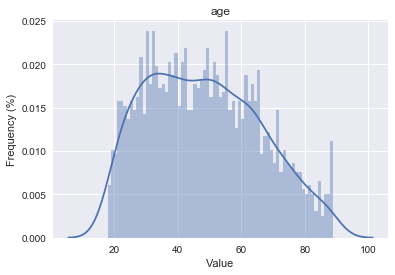

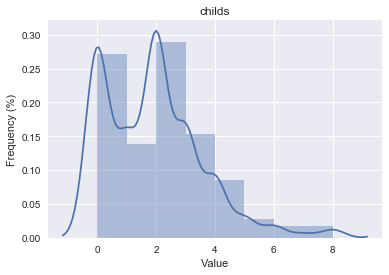

In [7]:
for var in dem:
    sns.set(color_codes=True)
    f, ax = plt.subplots(1, 1)
    to_plot = gss[var].dropna()
    sns.distplot(to_plot, bins=int(gss[var].max()-gss[var].min()))
    ax.set (xlabel = 'Value',ylabel = 'Frequency (%)')
    ax.set_title(var)
#     display(f)

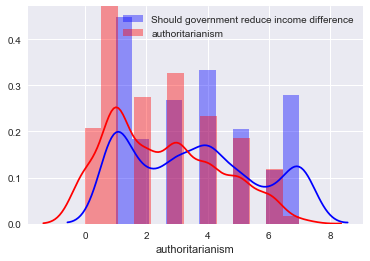

In [8]:


# num_dict = pd.DataFrame(num_dict)
# cat_dict = pd.DataFrame(cat_dict)
# print (type(num_dict['eqwlth']))

# # for var in num_vars:
# #     % matplotlib inline
#     sns.set(color_codes=True)
#     f, ax = plt.subplots(1, 1)
#     to_plot = gss[var].dropna()
#     sns.distplot(to_plot, bins=int(gss[var].max()-gss[var].min()))
#     ax.set (xlabel = 'Value',ylabel = 'Frequency (%)')
#     ax.set_title(var)
#     display(f)
#     # sns.kdeplot(to_plot, shade=True);
#     print (gss[var].describe())


f, ax = plt.subplots(1, 1)
sns.distplot( num_dict['eqwlth'], color="blue", label="Should government reduce income difference")
sns.distplot( num_dict['authoritarianism'], color="red", label="authoritarianism")
plt.legend()



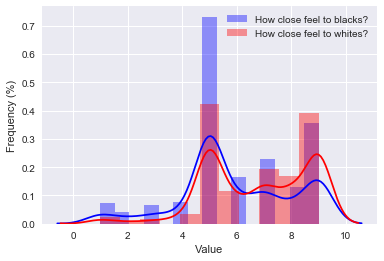

In [9]:
f, ax = plt.subplots(1, 1)
sns.distplot( num_dict['closeblk'], color="blue", label="How close feel to blacks?")
sns.distplot( num_dict['closewht'], color="red", label="How close feel to whites?")
ax.set(xlabel='Value', ylabel='Frequency (%)')
plt.legend()


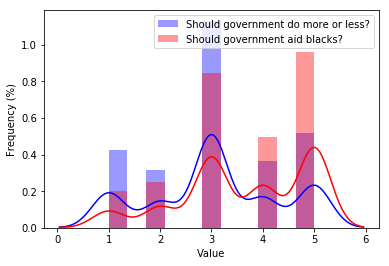

In [7]:

f, ax = plt.subplots(1, 1)
sns.distplot( num_dict['helpnot'], color="blue", label="Should government do more or less?")
sns.distplot( num_dict['helpblk'], color="red", label="Should government aid blacks?")
ax.set(xlabel='Value', ylabel='Frequency (%)')
plt.legend()


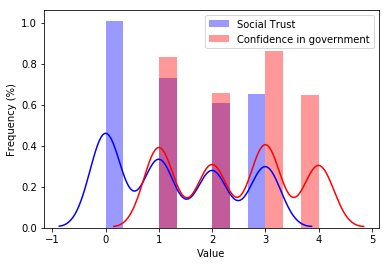

In [8]:

f, ax = plt.subplots(1, 1)
sns.distplot( num_dict['social_trust'], color="blue", label="Social Trust")
sns.distplot( num_dict['con_govt'], color="red", label="Confidence in government")
ax.set(xlabel='Value', ylabel='Frequency (%)')
plt.legend()


All pairs of variables above are similarly distributed and have reasonable variance.

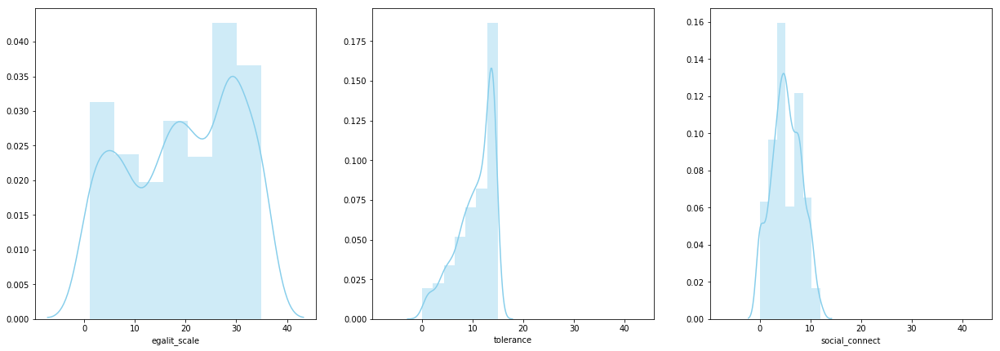

In [9]:

f, axes = plt.subplots(1,len(scales), figsize=(21, 7), sharex=True)
for i,name in enumerate(scales):
    sns.distplot( num_dict[name], hist=True, bins=7, color="skyblue", ax=axes[i])
    ax.set(xlabel='Value', ylabel='Frequency (%)', title = name)
#     sns.distplot( num_dict['childs'],hist=True,bins=7, color="olive", ax=axes[1])


**Now that I have plotted the individual variables, I want to see the correlation between different variables to start looking for interesting patterns. I will start with a pair plot between all variables.**

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:454: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X>clip[0], X<clip[1])] # won't work for two columns.
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:454: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X>clip[0], X<clip[1])] # won't work for two columns.


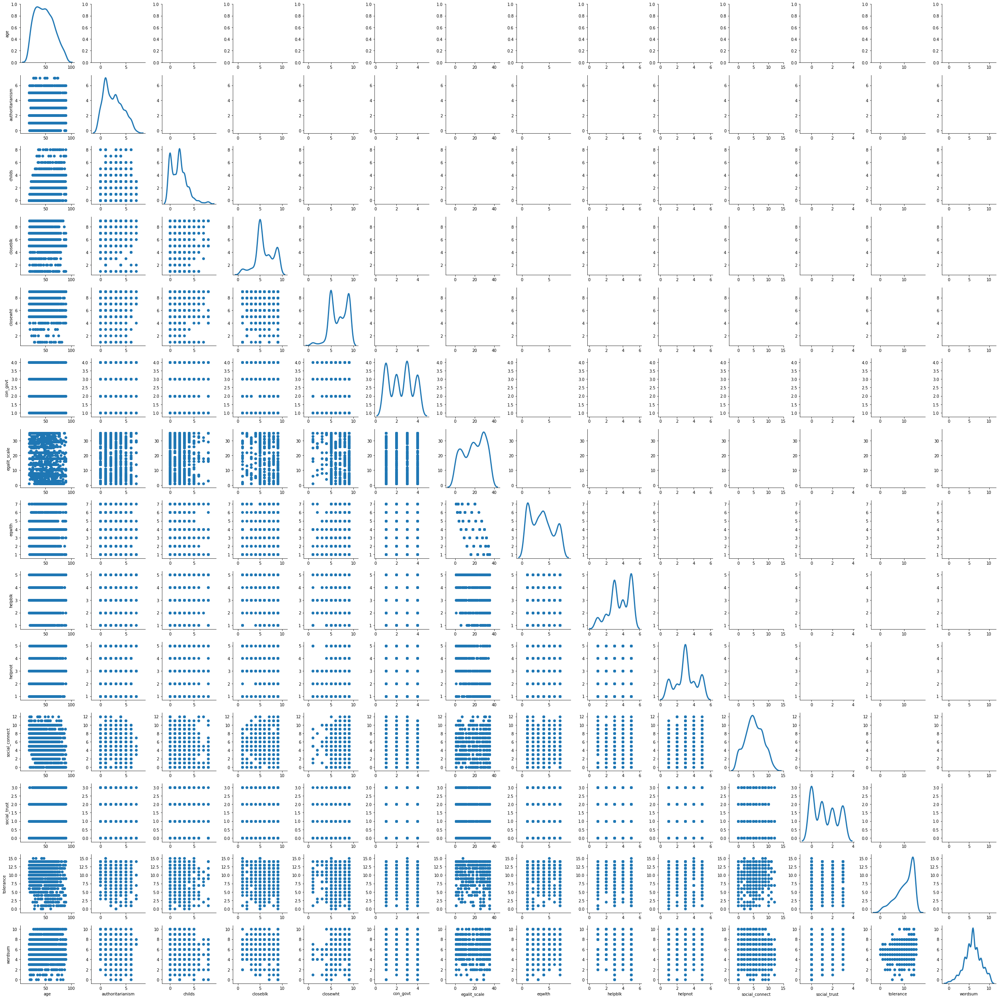

In [21]:
# f, ax = plt.subplots(1, 1)
g = sns.PairGrid(pd.DataFrame(num_dict), diag_sharey=False)
# g.map_lower(sns.kdeplot, cmap="Blues_d")
g.map_lower(plt.scatter)
# g.map_upper (sns.lmplot, label=label)
g.map_diag(sns.kdeplot,  lw=3, legend=False)

**There definitely are some variables that are correlated, like between eqlwth and egalit_scale. I now want to have a close-up look at those pairplots. So I go on to plot the opinion/scale variablese against demographics to see if they are somehow correlated.**

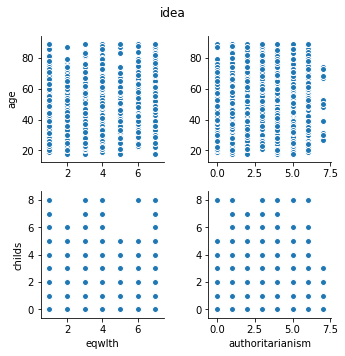

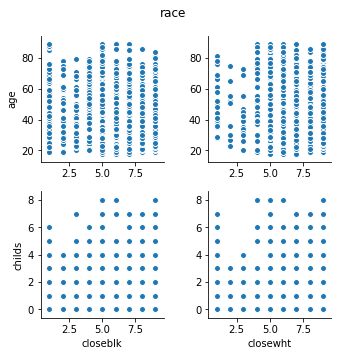

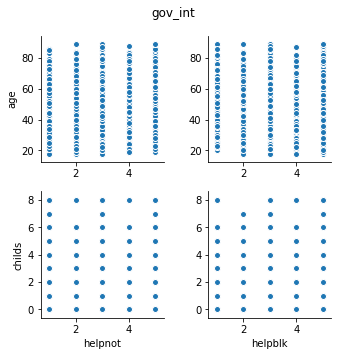

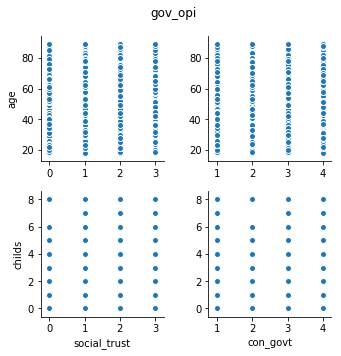

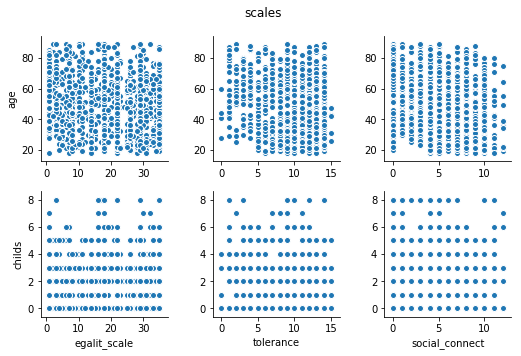

In [10]:

for name, item in features.items():
#     f, ax = plt.subplots(1, 1)
    pp = sns.pairplot(data=pd.DataFrame(num_dict),
                      y_vars=dem,
                      x_vars=item)
    plt.subplots_adjust(top=0.9)
    pp.fig.suptitle(name)
#     pp.set(title = name)


**There seems to be some correlations, but because the numerical variables are somewhat categorical, the datapoints are crowded together in the pairplot. Now I will use correlation matrix to get the relationships.**

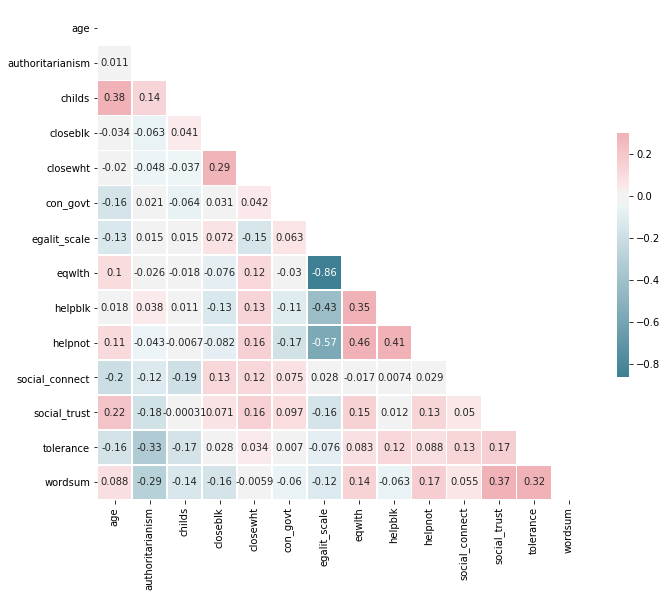

In [11]:

corr = pd.DataFrame(num_dict).corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr, mask=mask, annot=True, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})



**Some salient relationships:**
* eqwlth, helpblk, helpnot are negatively correlated with egalit_scale
* eqwlth is positively correlated iwht helpblk, and helpnot
* helpnot is positively corerlated wiht helpblk
* positive correlation between childs and age
* age, wordsum are positively correlated iwht social trust
* positive correlation between wordsum and tolerance
* positive correlation between closewht and closeblk

## Exploring Categorical Variables


**Like numerical variables, I first group the categorical variables and construct a dictionary of different groups.**

In [77]:
cat_vars = ['abany','affrmact', 'affrmact2', 'attend3', 'bible','black','born', 'cappun', 'colath', 'colrac', 'colcom',
            'colmil', 'conbus', 'coneduc', 'confed', 'confinan','conjudge', 'conlabor', 'conlegis', 'conmedic',
            'conpress', 'consci', 'degree', 'ethnic', 'evangelical', 'fefam',  'fechld', 'fund2', 'grass', 'gunlaw', 
            'happy', 'helpoth', 'helppoor', 'helpsick', 'hhtype1', 'income06', 'intecon', 'intenvir', 'intethn', 'kids', 
            'marital', 'militarist_tol', 'nataid', 'natenrgy', 'natenvir', 'natfare', 'natheal', 'natmass', 'natpark', 
            'natrace', 'natroad', 'natsoc', 'natspac', 'news', 'owngun', 'partyid_3', 'polviews', 'pornlaw', 'postlife', 
            'racdif1','sex', 'social_cons3', 'spend3', 'uscitzn', 'voted08','workhard', 'wrkgvt', 'wrkslf', 'wrkstat'] 
cat_dict = dict()
for j in cat_vars:
    cat_dict[j] = gss[j].dropna()
    
dem_cat = ['degree', 'ethnic', 'owngun', 'marital', 'income06', 'partyid_3','sex']
women= ['abany', 'fefam']
policy = ['cappun', 'grass', 'gunlaw', 'pornlaw', 'affrmact2']
self_reported = ['happy', 'polviews', 'spend3']
features_cat = {'women':women, 'policy':policy, 'self_reported':self_reported}


# religion= ['attend3', 'bible', 'postlife']
# opinion = ['colcom','colmil','conbus','coneduc', 'confed', 'confinan','conlabor', 'conmedic','conpress', 
#            'nataid',  'natfare', 'natheal', 'natrace']
# work= ['workhard', 'wrkgvt', 'wrkslf', 'wrkstat', 'income06']


**And then I look at their descriptions to check then number of missing data. Some have a lot of missing data, like abany, grass, gunlaw owngun, and etc, but all have above 1000 observations, which I think is sufficient to draw exploratory conclusions. Thus, I will drop all missing variables in my explorations.**

In [78]:
for cat in cat_vars:
    print (f'\nDescription of {cat}')
    print (gss[cat].value_counts(dropna = False))
# list(gss['abany'].value_counts().index)


Description of abany
NaN    726
NO     694
YES    554
Name: abany, dtype: int64

Description of affrmact
NaN                      753
STRONGLY OPPOSE PREF     629
OPPOSE PREF              354
STRONGLY SUPPORT PREF    139
SUPPORT PREF              99
Name: affrmact, dtype: int64

Description of affrmact2
Oppose     983
NaN        753
Support    238
Name: affrmact2, dtype: int64

Description of attend3
Low         871
High        603
Moderate    492
NaN           8
Name: attend3, dtype: int64

Description of bible
INSPIRED WORD     865
WORD OF GOD       634
BOOK OF FABLES    404
NaN                71
Name: bible, dtype: int64

Description of black
No     1477
Yes     301
NaN     196
Name: black, dtype: int64

Description of born
YES    1700
NO      271
NaN       3
Name: born, dtype: int64

Description of cappun
FAVOR     1183
OPPOSE     641
NaN        150
Name: cappun, dtype: int64

Description of colath
ALLOWED        818
NaN            707
NOT ALLOWED    449
Name: colath, dtype: int64

**Like what I did previously with the numerical variables, I plot all categorical variables of interest in different groups against demographic variables to see if the latter is a contributing factor to the pattern of the former. All measures are normalized as percentages.**

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


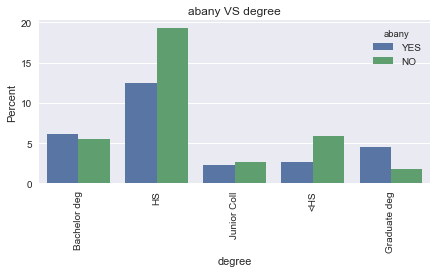

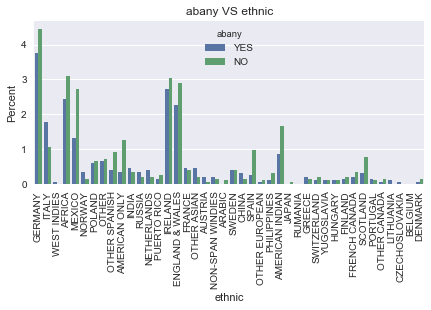

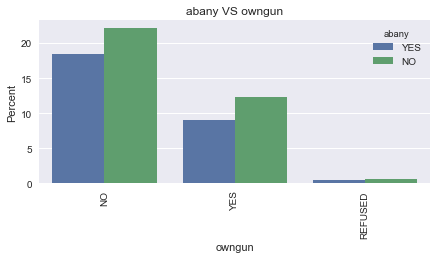

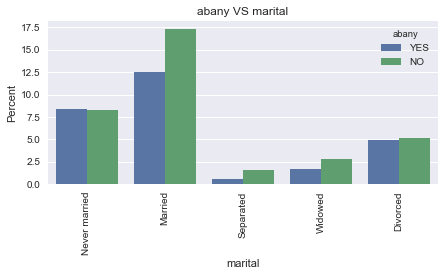

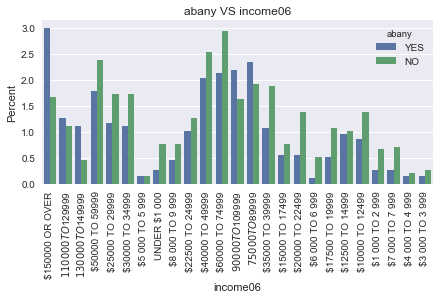

...

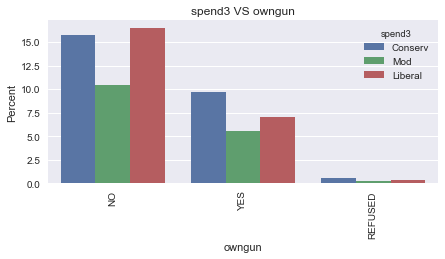

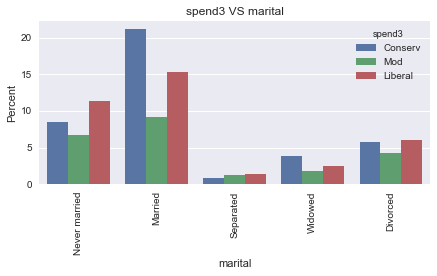

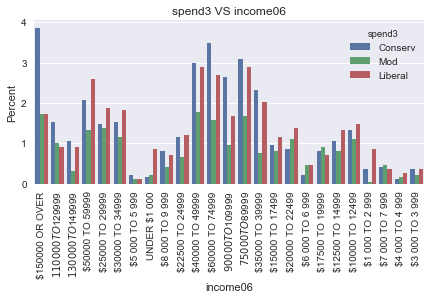

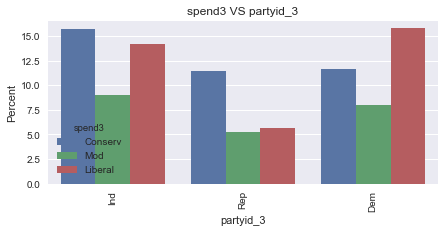

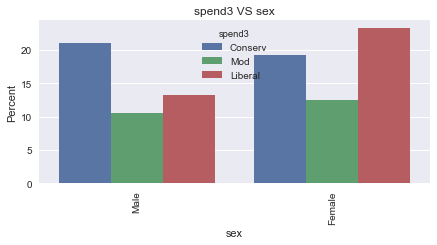

In [20]:

# p=0

for name, item in features_cat.items():
    for i in item:
        for n, k in enumerate(dem_cat):
            f, ax = plt.subplots(figsize=(7, 3))
#             g = sns.countplot(x= k, hue=i, data=pd.DataFrame(cat_dict))
#             xlabels = list(set(pd.DataFrame(cat_dict)[k].tolist()))
            df = pd.DataFrame(cat_dict)
            g1 = sns.barplot(x= k, y=k, hue=i, data=df, estimator=lambda x: len(x) / len(df) * 100, orient="v")
            plt.xticks(rotation=90)
            ax.set(title =' VS '.join([i,k]),ylabel="Percent")
            

        
        
        
        



**Some conclusions:**
* abany VS degree shows that people with Bachelor and graduate degrees seem to have higher percentage of saying YES to having an abortion than saying no, and junior college students seem to have similar percentages. 
* abany VS ethnic shows that the there are difference in the percentage people who report to  an abortion across different origins
* fefam VS marital shows that more percentage of married people seem to agree with the traditional role of women in family, compared to never married, divorced and separated people. --> more exploration with and happiness
* fefam VS partyid_3 shows that compared to independent and democratics, more percentage of republican people who agree with more traditional role in family.
* cappun VS degree shows more high school graduates favor capital punishment
* cappun VS ethnic shows people of European decent (Italy, Irish, Scottish, Gernmany British) tend to favor capital punishment. 
* cappnun VS partyid_3 shows that much higher pct of republicans favor capital punishment
* cappun VS sex shows that much pct of men favor capital punishment
* grass VS marital shows that married people do not want marijuana to be legal.
* grass VS partyid_3 shows taht Republicans do not want marijuana to be legal.
* pornlaw and gunlaw seem to be ambiguous in its description of how people feel about gun and porn
* affrmact2 VS ethinc shows taht significantly more Irish, English, Germany, Mexican, Spanish, native American (surprisingly) and Scottish people oppose affirmative action. Approximately equal number of African Americans oppose affirmative action as well...
* More pct of Republicans oppose affirmative action.
* happy VS degree shows that HS and <HS tend to be more unhappy.
* happy VS marital shows that married people tend to be more happy
* spend3 VS partyid_3 says Republicans are more conservative in their spendings.
* spend3 VS sex says Women are more liberal in their spendings

**Now I am intersted in how people's self-reported scores affects their policy views. I am changing the format of graph to a heatmap of categorical data being the high achiever that I am...**

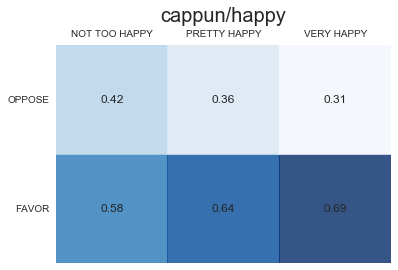

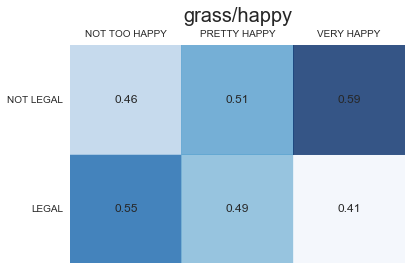

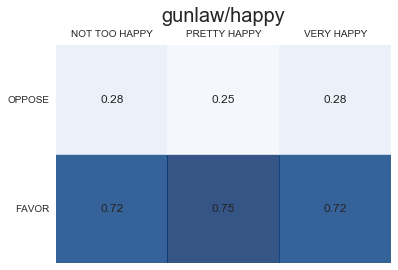

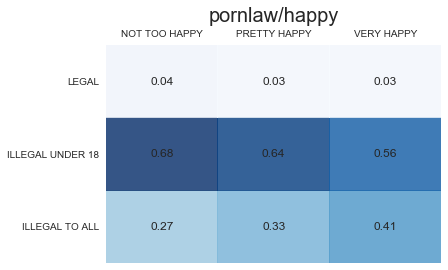

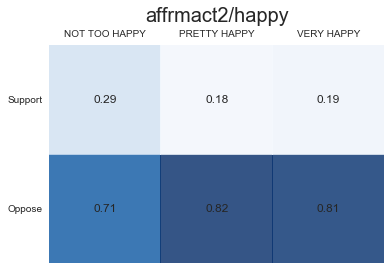

...

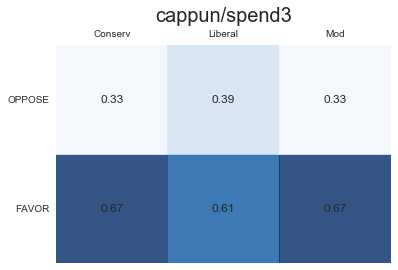

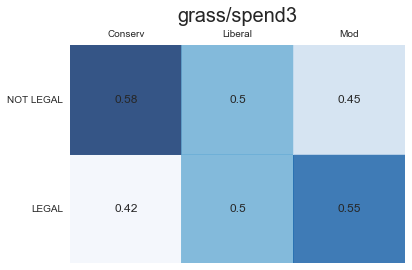

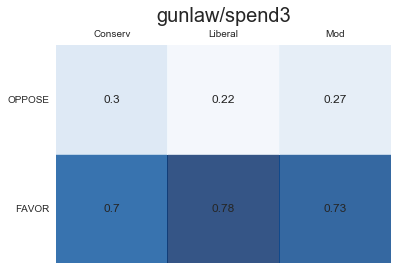

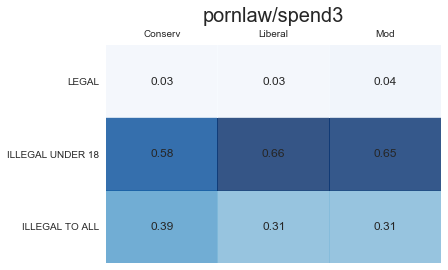

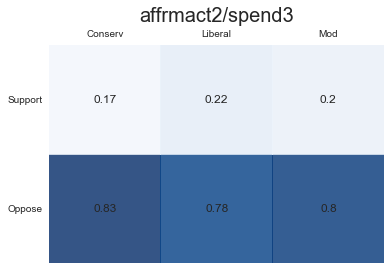

In [59]:
for b in self_reported:
    for a in policy:
        cross = pd.crosstab(pd.DataFrame(cat_dict)[a],pd.DataFrame(cat_dict)[b])
#         print (cross.index)
        xlabels = list(cross.columns)
        ylabels = list(cross.index)
        counts = cross.as_matrix().astype(int)
        counts = np.round(counts/counts.sum(axis=0),2)
        fig, ax = plt.subplots()
        heatmap = ax.pcolor(counts, cmap=plt.cm.Blues, alpha=0.8)
        fig = plt.gcf()
#             fig.set_size_inches(8, 11)
#         ax.set_frame_on(False)
        ax.set_yticks(np.arange(counts.shape[0]) + 0.5, minor=False)
        ax.set_xticks(np.arange(counts.shape[1]) + 0.5, minor=False)
#         ax.invert_yaxis()
        ax.xaxis.tick_top()
#         xlabels = list(pd.DataFrame(cat_dict)[b]) 
#         ylabels = list(pd.DataFrame(cat_dict)[a])
        ax.set_title ('/'.join([a,b]), y=1.08,fontsize=20)
        ax.set_xticklabels(xlabels, minor=False)
        ax.set_yticklabels(ylabels, minor=False)
#         plt.xticks(rotation=90)
#         ax.grid(False)
        ax = plt.gca()
        for t in ax.xaxis.get_major_ticks():
            t.tick1On = False
            t.tick2On = False
        for t in ax.yaxis.get_major_ticks():
            t.tick1On = False
            t.tick2On = False
        for y in range(counts.shape[0]):
            for x in range(counts.shape[1]):
                plt.text(x + 0.5, y + 0.5, counts[y, x],
                     horizontalalignment='center',
                     verticalalignment='center')
#         fig, ax = plt.subplots()
#         df = pd.DataFrame(cat_dict)
#         g1 = sns.barplot(x= a, y=a, hue=b, data=df, estimator=lambda x: len(x) / len(df) * 100, orient="v")

        

**Some conclusions:**  
* Very happy people have the highest support rate for capital punishment
* Not too happy people have the highest support rate for marijuana. Very happy people have the highest rate for opposing marijuana
* The divide between liberal and conservative in their attitude towards capital punishment is hugh: liberals oppose capital punishment while conservatives support them
* The divide between liberal and conservative in their attitude towards marijuana is hugh: liberals support marijuana while conservatives oppose them
* Interesting the divide between liberal and conservative in their attitude towards affirmative action is not that high. Except for extreme liberals, many more oppose affirmative action than support it.


**I just realized I like this form of plotting (and that I spend quite sometime getting this non-seaborn-supported graph to work)so I decided to plot some more. This time of self_reported +policy against idea+gov_opi.**

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


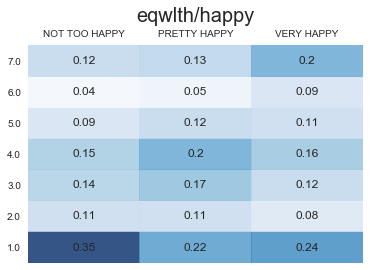

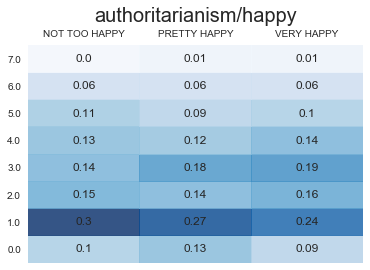

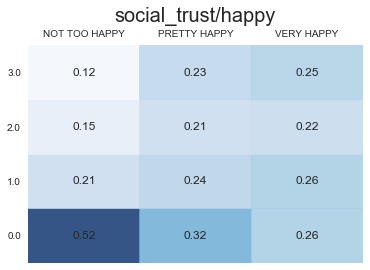

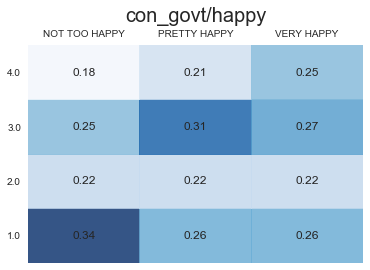

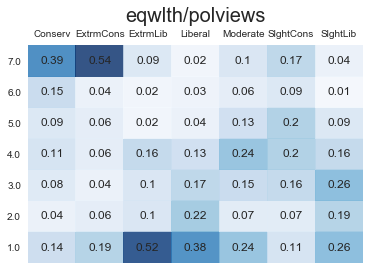

...

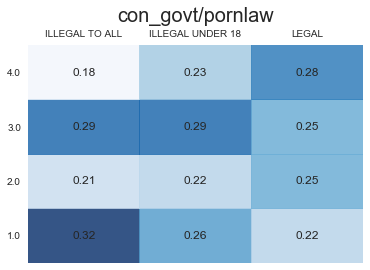

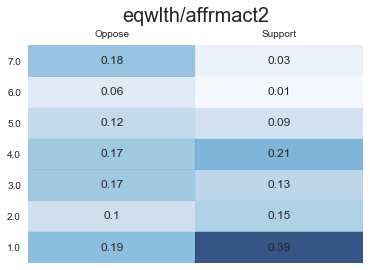

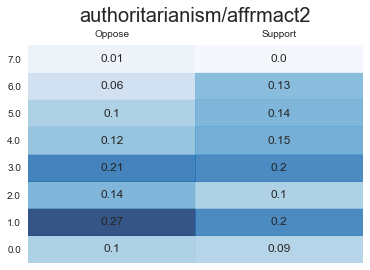

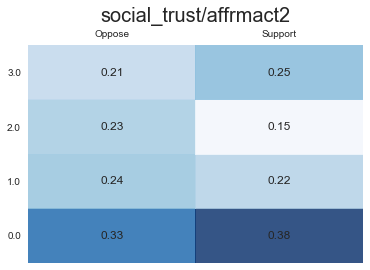

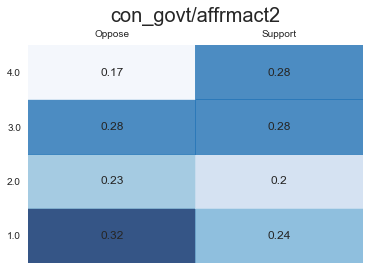

In [61]:
for b in self_reported +policy:
    for a in idea+gov_opi:
        cross = pd.crosstab(gss[a].dropna(),gss[b].dropna())
#         print (cross.index)
        xlabels = list(cross.columns)
        ylabels = list(cross.index)
        counts = cross.as_matrix().astype(int)
        counts = np.round(counts/counts.sum(axis=0),2)
        fig, ax = plt.subplots()
        heatmap = ax.pcolor(counts, cmap=plt.cm.Blues, alpha=0.8)
        fig = plt.gcf()
#             fig.set_size_inches(8, 11)
#         ax.set_frame_on(False)
        ax.set_yticks(np.arange(counts.shape[0]) + 0.5, minor=False)
        ax.set_xticks(np.arange(counts.shape[1]) + 0.5, minor=False)
#         ax.invert_yaxis()
        ax.xaxis.tick_top()
#         xlabels = list(pd.DataFrame(cat_dict)[b]) 
#         ylabels = list(pd.DataFrame(cat_dict)[a])
        ax.set_title ('/'.join([a,b]), y=1.08,fontsize=20)
        ax.set_xticklabels(xlabels, minor=False)
        ax.set_yticklabels(ylabels, minor=False)
#         plt.xticks(rotation=90)
#         ax.grid(False)
        ax = plt.gca()
        for t in ax.xaxis.get_major_ticks():
            t.tick1On = False
            t.tick2On = False
        for t in ax.yaxis.get_major_ticks():
            t.tick1On = False
            t.tick2On = False
        for y in range(counts.shape[0]):
            for x in range(counts.shape[1]):
                plt.text(x + 0.5, y + 0.5, counts[y, x],
                     horizontalalignment='center',
                     verticalalignment='center')

**Some conclusions:**
* Not too happy people especially tend to think government should not reduce income differences
* Not too happy people tend to have low social trust
* Not too happy people tend to have low confidence in government while happy people have high confidence in government
* The conservative/liberal divide in opinion towards reducing income difference is huge: liberal people oppose so while conservatives are for it
* Liberal people seem poliarized in their social trust, while conervatives are not
* Conservatives and extreme liberals are not confident in the government
* Liberal/Moderate spenders have less social trust
* People who support marijuana have more fvorable opinions towards authoritarianism
* People who oppose marijuana have more confidence in government
* People who support affirmative action have more favorable opinion of the government
* People who support affirmative action have more confidence in government

## Categorical variable with Numeric Variables
### I. exploring correlation between two numerical variables categorized by one categorical variables

**With the correlation matrix in mine, I want to see how categorical variables can affect colinear numerical variables, so I plot the relationships into tuples and filter them through an array of categorical variables**

In [63]:
tup1 = (['eqwlth', 'helpblk', 'helpnot'], ['egalit_scale'])
tup2 = (['helpblk', 'helpnot'], ['eqwlth']) 
tup3 = (['helpnot'],['helpblk'])
tup4 = (['childs'],['age'])
tup5 = (['age', 'wordsum'], ['social_trust'])
tup6 = (['wordsum'], ['tolerance'])
tup7 = (['closewht'], ['closeblk'])
relationships = [tup1, tup2, tup3, tup4, tup5, tup6, tup7]
bi_cat = ['sex']
top = ['eqwlth', 'helpblk', 'helpnot', 'egalit_scale']
top1 = ['childs','age','wordsum','social_trust']
cat = ['marital', 'sex', 'partyid_3','degree','ethnic','income06','happy']
df = pd.concat([pd.DataFrame(num_dict), pd.DataFrame(cat_dict)])

**Here I plot each relationship**

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


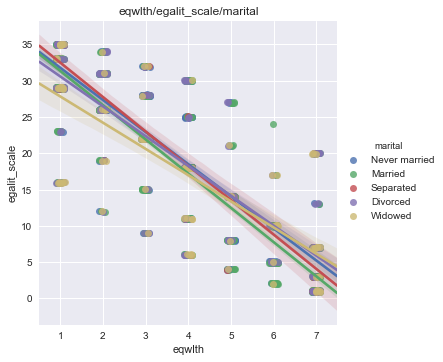

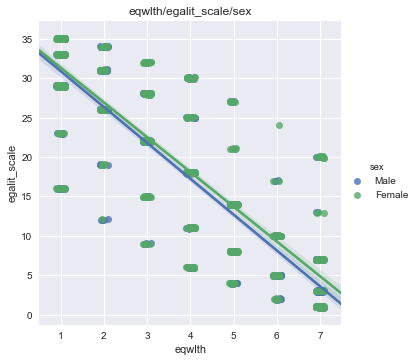

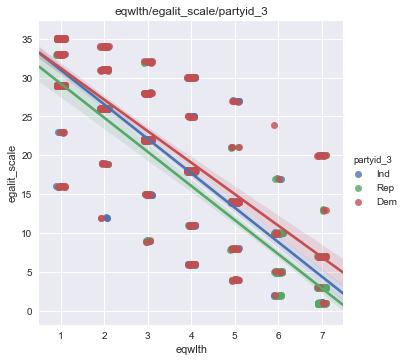

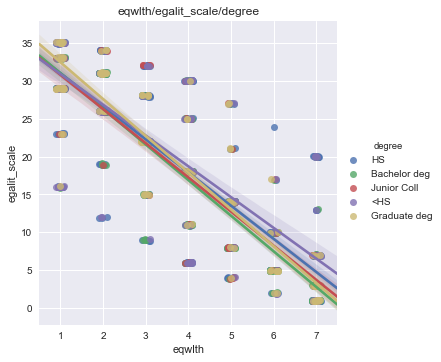

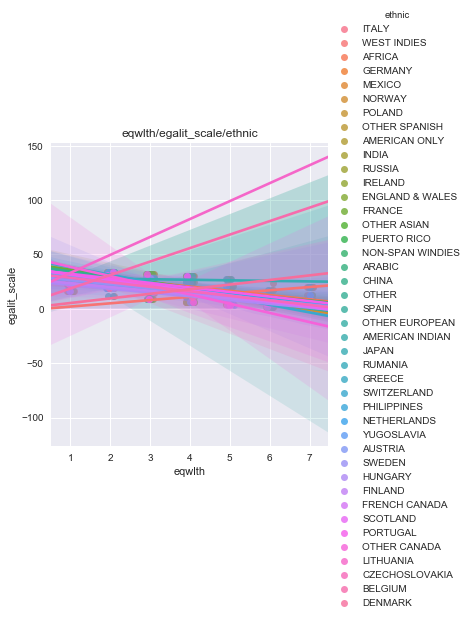

...

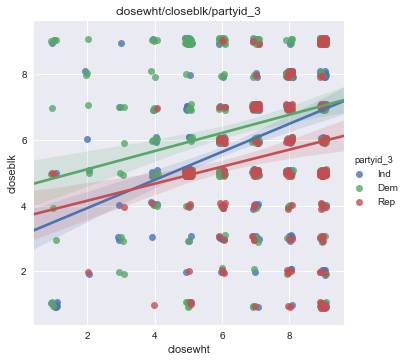

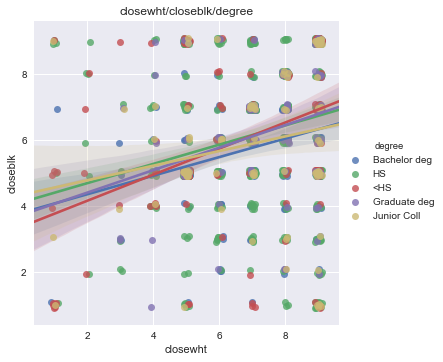

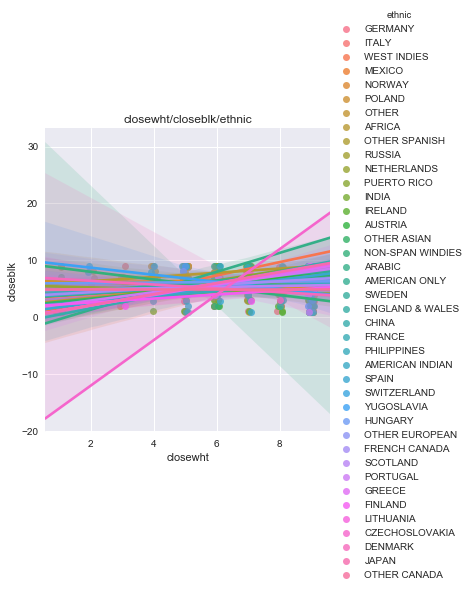

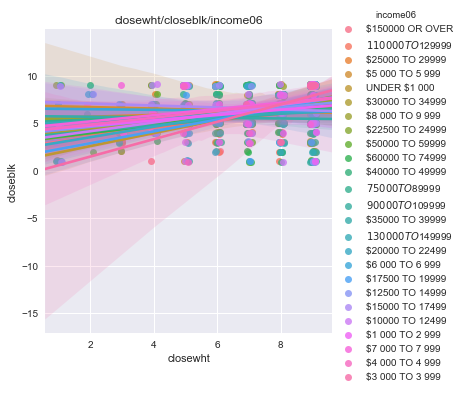

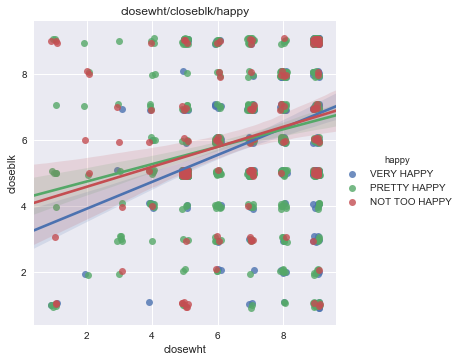

In [64]:


for pre, post in relationships:
    for i in pre:
        for j in post:
            for k in cat:
#                 g = sns.lmplot(x=i, y=j, hue=k, size=5, data=df)
# # Use more informative axis labels than are provided by default
#                 g.set_axis_labels(i,j)
#                 g.set(title = '/'.join([i,j,k]))
                sns.set()        
                g = sns.lmplot(x=i, y=j,hue =k, size=5, x_jitter = 0.1,y_jitter =0.1,data=gss[[i,j,k]].dropna(axis=0, how = 'any'))
#                 break
                # Use more informative axis labels than are provided by default
                g.set_axis_labels(i,j)
                g.set(title = '/'.join([i,j,k]))

                
# sns.set(color_codes=True)
# colors =sns.color_palette("husl", len(df[top+[k]].columns))
# for k in cat:
#     g = sns.pairplot(df[top+[k]],dropna=True, hue=k)
# print(df["sex"])

**Some conclusions:**
* The negative correlation between egalit_scale and eqwlth is disrupted by ethnicity, but not by anything else
* The negative correlation betwteen helpblk and egalit_scale is disrupted by partyid_3: Republicans have more drastic negative correlation (the less egalitarian they are, the more willing they are to help black people)
* For republicans, they have more drastic in when people believe more in equality of wealth, the more willing they are to help black people.
* People with <HS education's willingness to help black people is unaffected by their belief in equality of wealth
* People who belive in equality of wealth believes the government should do more, especially for republicans, and very happy people 
* Older people have more children, especially for widowed 
* Older people have more social trust, more so for happy people, bachelor degree holders, less so for separated people and unhappy people . There is a negative relationship between age and social trust for graduate students.
* Poeple who score more in vocabulary test tend to have more tolerance, more for people with higher degrees. 


For another representation for the conclusions above, 

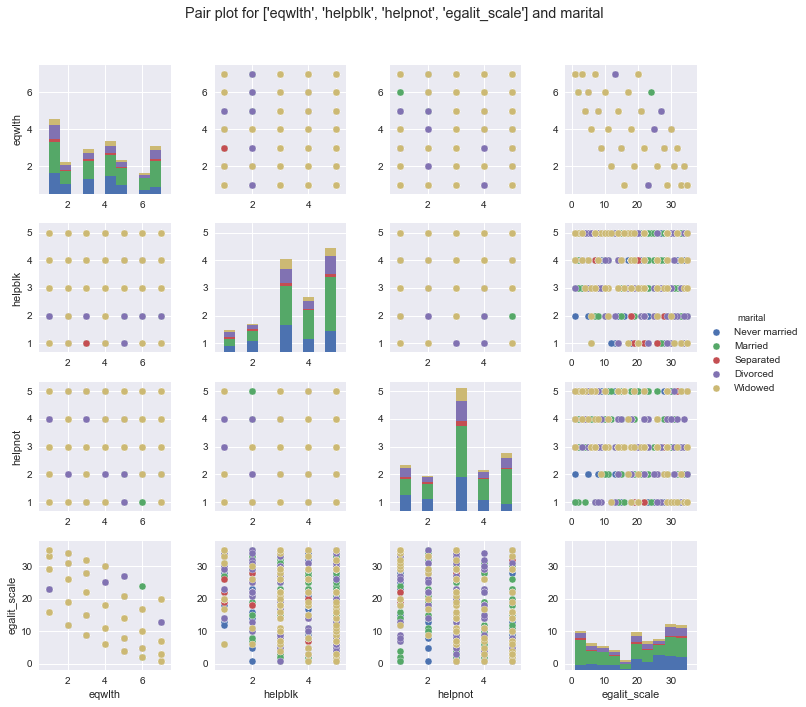

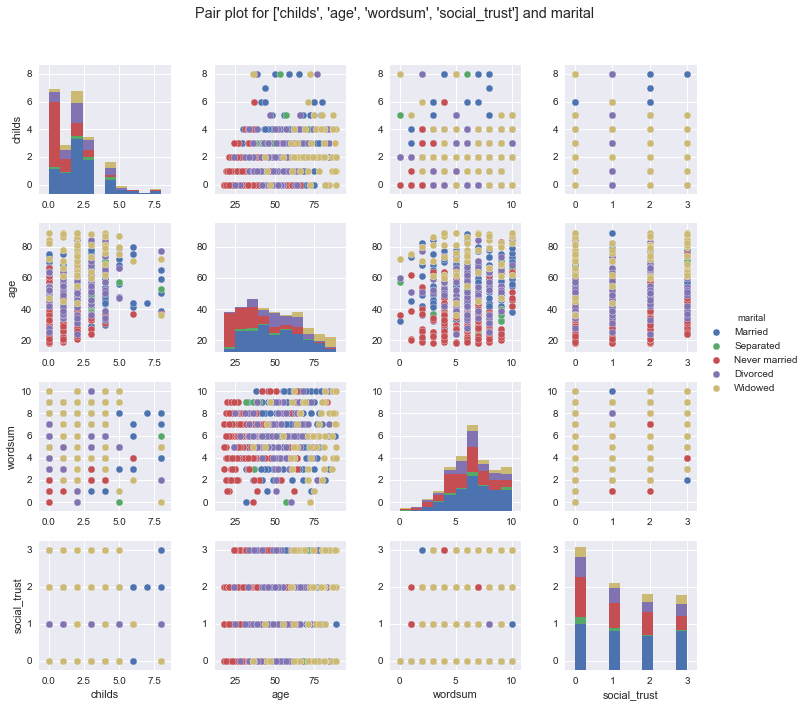

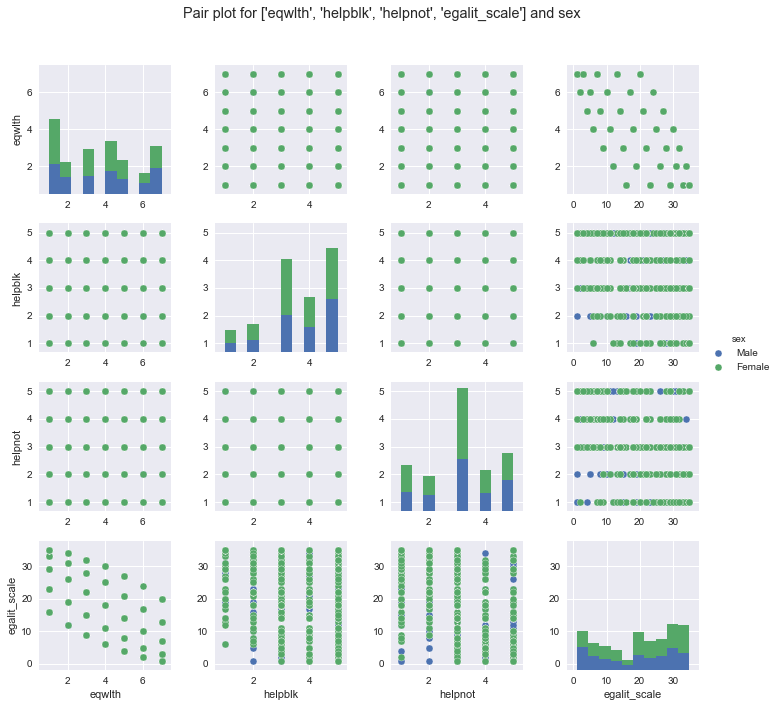

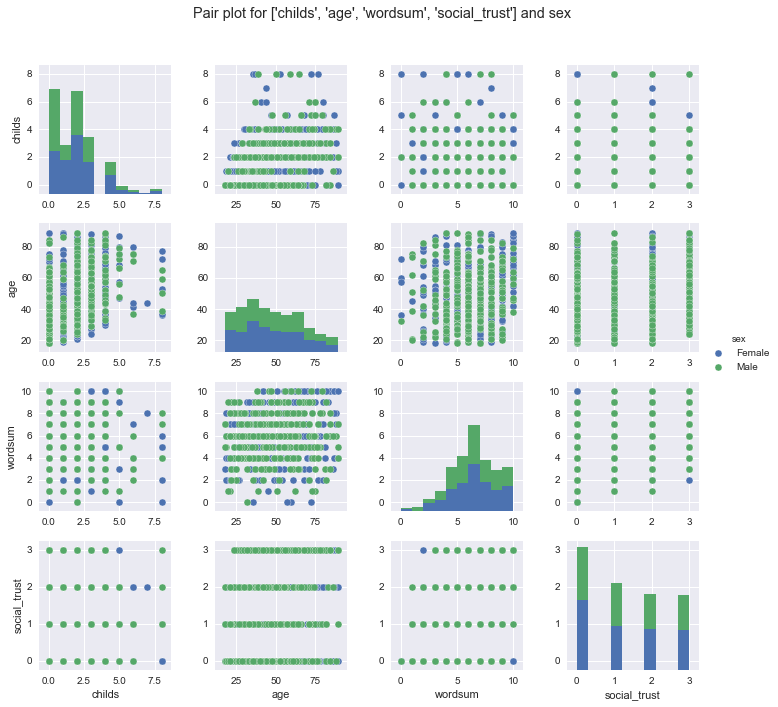

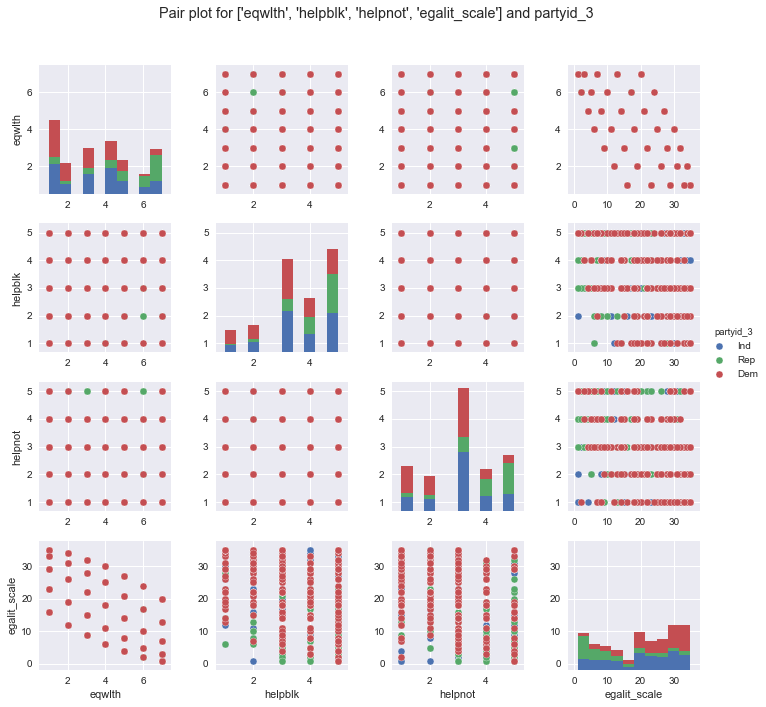

...

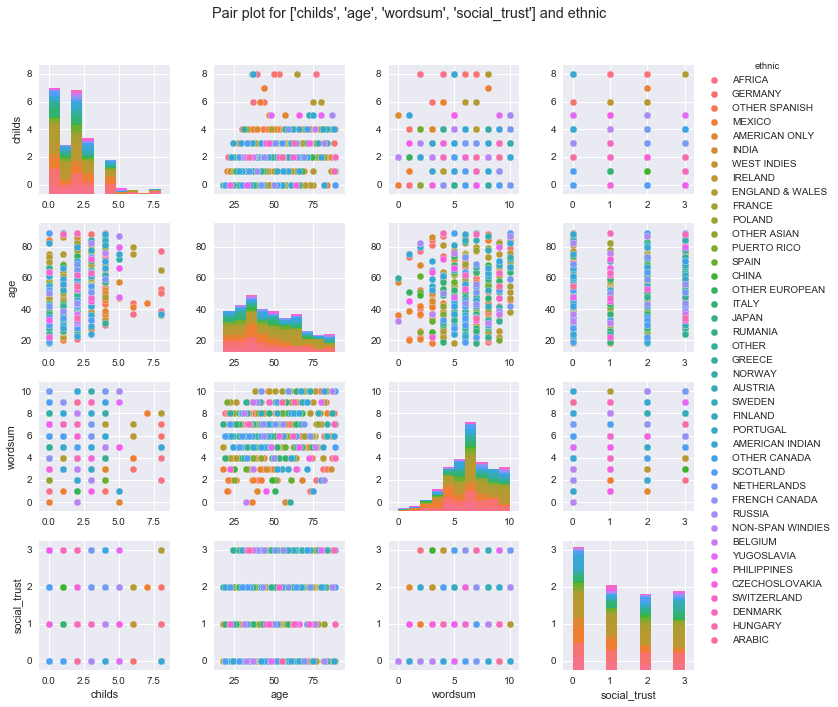

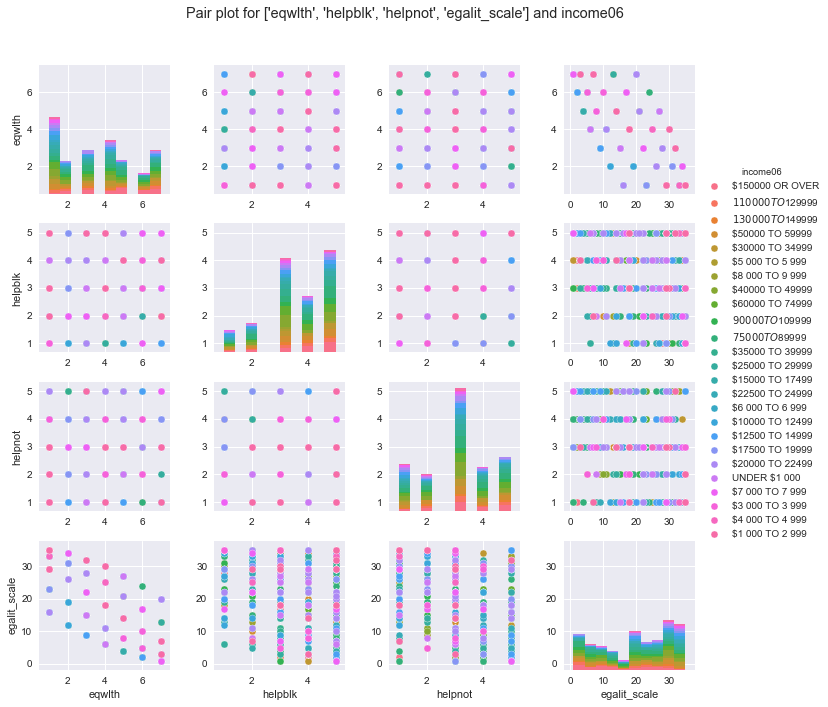

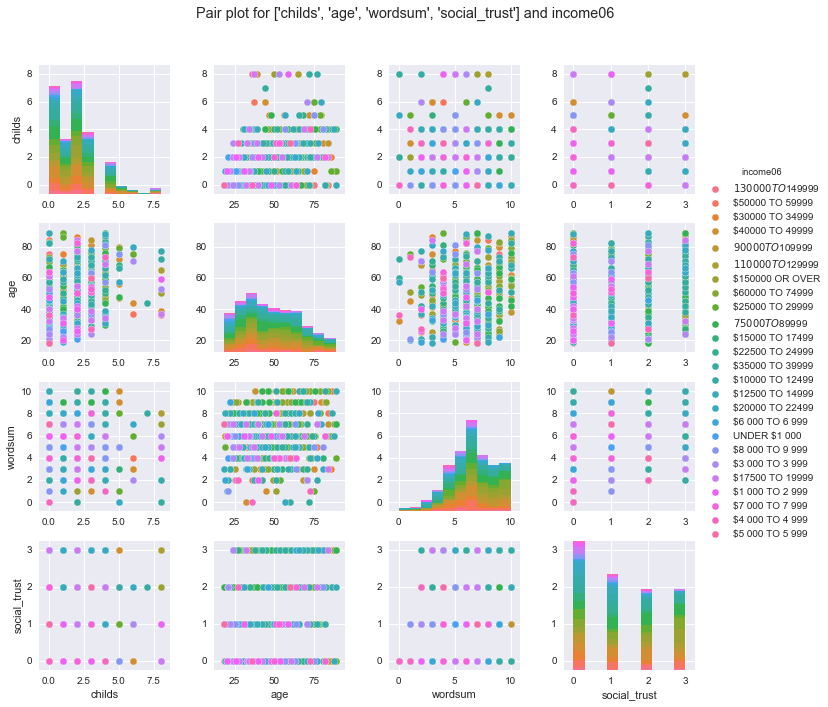

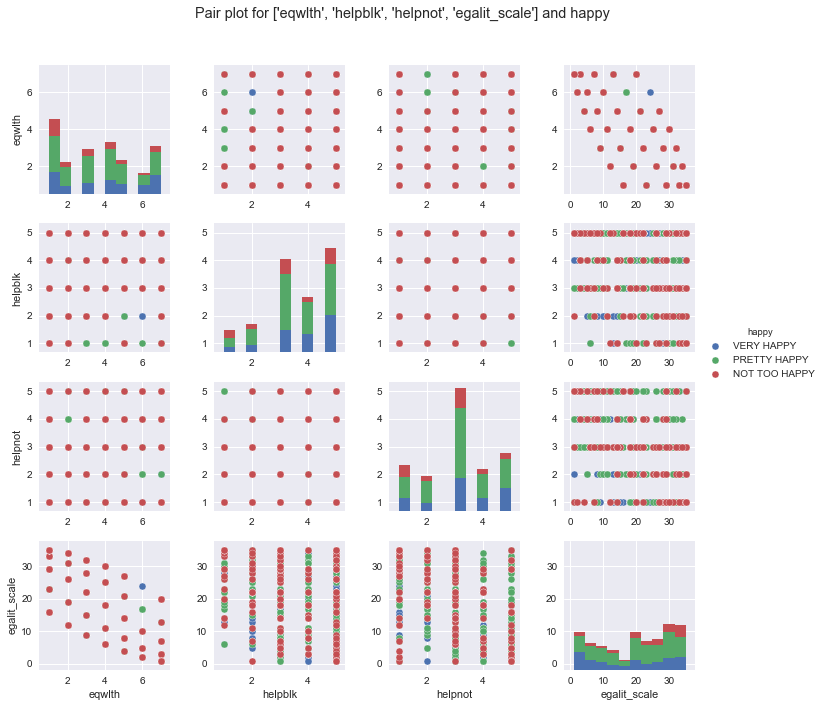

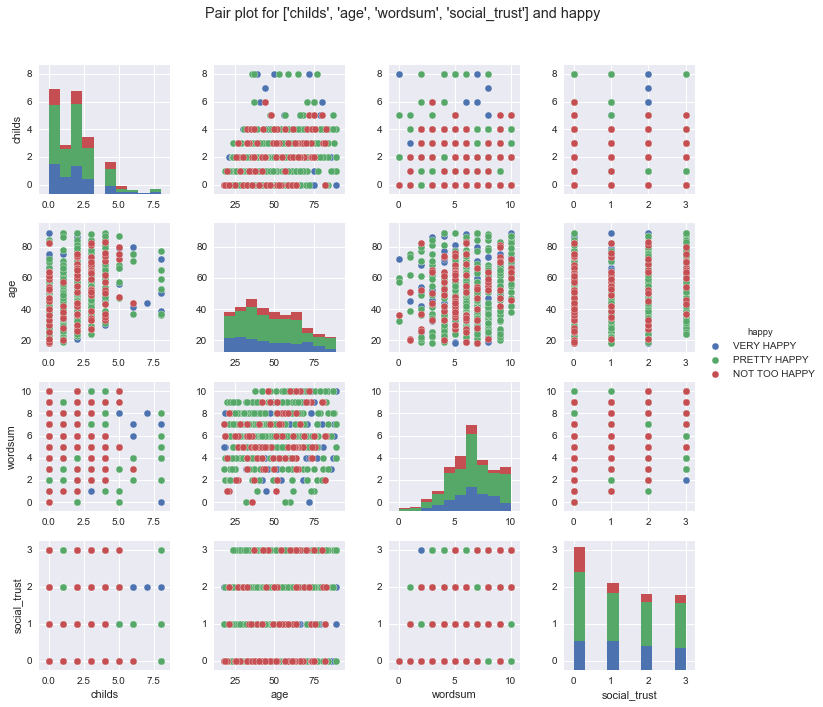

In [91]:

# sns.swarmplot(x="day", y="total_bill", hue="sex", data=tips);
for k in cat:
    g = sns.pairplot(gss[top+[k]].dropna(axis=0, how = 'any'),dropna=True, hue=k)
    plt.subplots_adjust(top=0.9)
    g.fig.suptitle(f'Pair plot for {top} and {k}') 
    g1 = sns.pairplot(gss[top1+[k]].dropna(axis=0, how = 'any'),dropna=True, hue=k)
    plt.subplots_adjust(top=0.9)
    g1.fig.suptitle(f'Pair plot for {top1} and {k}') 

**The above graphs are like trophy wives/husbands, good-looking but doesn't really give me more information than what I already have. Now I am interested in the variance of numerical variable when filtering it through people's opinion or self-reports and their demographics. Here I will use the violin plots.**

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


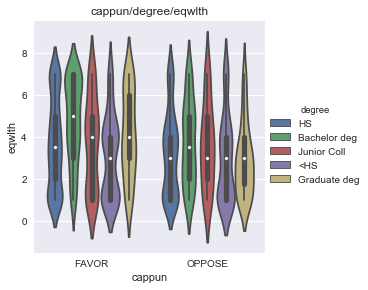

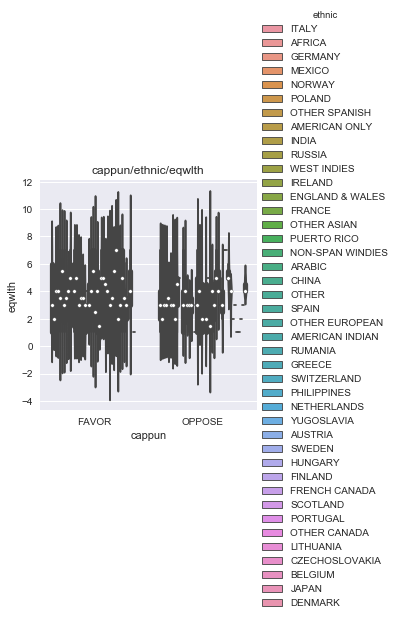

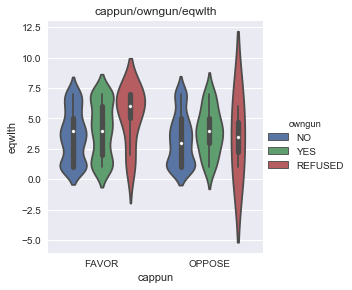

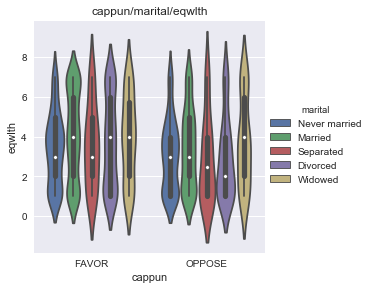

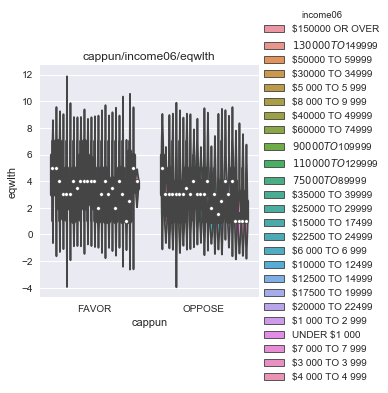

...

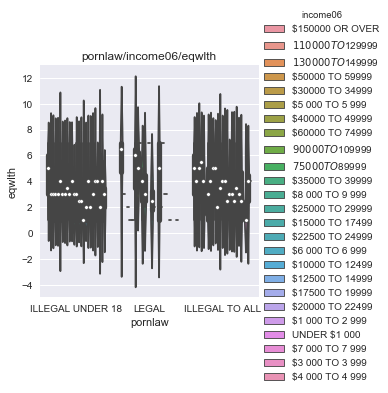

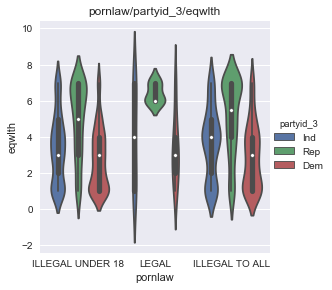

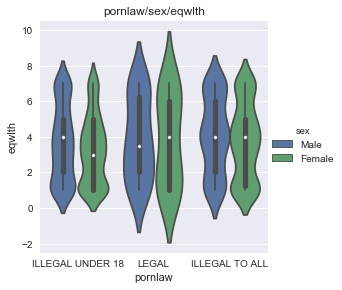

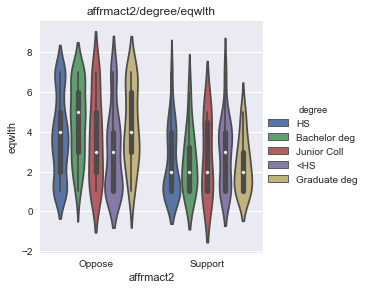

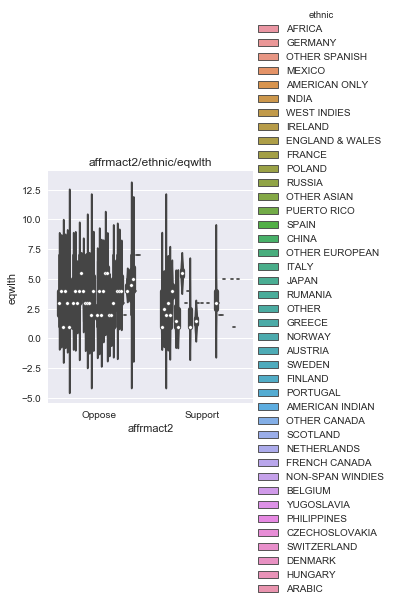

In [10]:
# print (policy+self_reported)
try:
    for nume in top:
        for cat1 in policy+self_reported:
            for cat2 in dem_cat:
#                 df =gss[[nume,cat1,cat2]]
                sns.set()   
                g = sns.factorplot(x=cat1, y=nume, hue=cat2, data=gss[[nume,cat1,cat2]].dropna(axis=0, how = 'any'), kind="violin")
                g.set(title='/'.join([cat1,cat2,nume]), xlabel = cat1, ylabel=nume)
except ValueError:
    pass



**Some conclusions:**
* People who support marijuana tend to have less faith in equality of wealth, especially so for <HS and HS. This stands robust for a number of variables like partyid_3, sex .
* Republicans are have more faith in equality of wealth, and are more for opposing marijana with less variation. Democrats who support marijuana have less faith in equality of wealth with little variation. 


**Now I will run similar types of analysis (filtering numerical variables through people's opinion or self-reports and their demographics) on another set of numerical variables. This time I will use another form of plotting, which also captures the variation with standard deviation.**

D:\programs\Anaconda3\lib\site-packages\seaborn\categorical.py:1508: FutureWarning:

remove_na is deprecated and is a private function. Do not use.

D:\programs\Anaconda3\lib\site-packages\matplotlib\pyplot.py:523: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



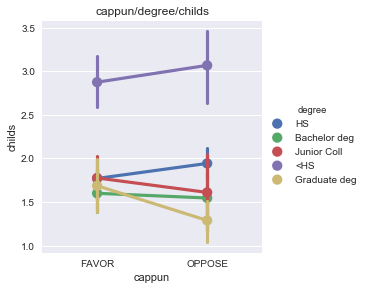

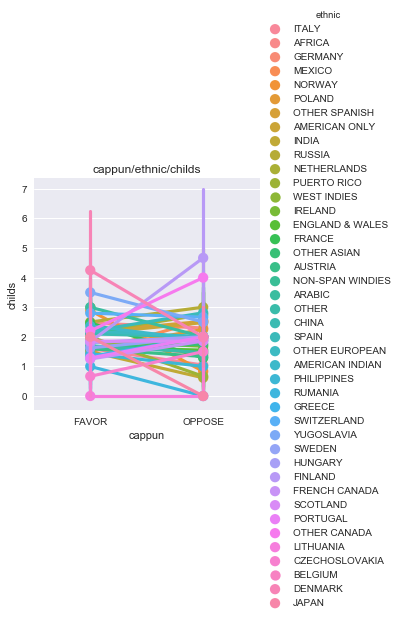

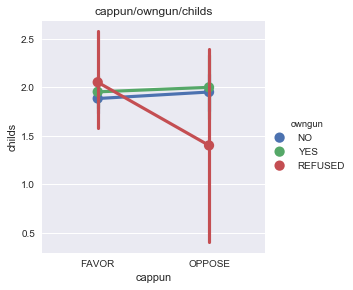

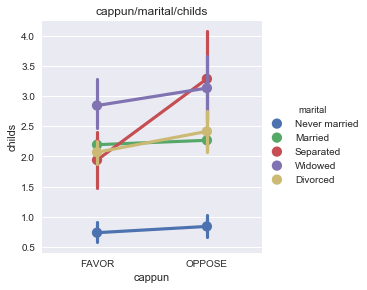

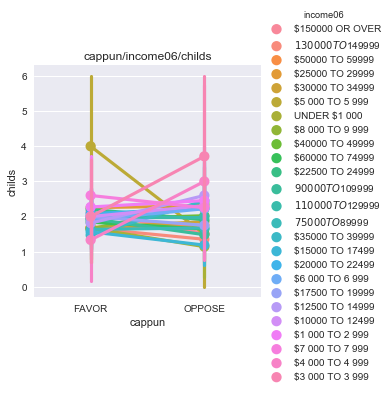

...

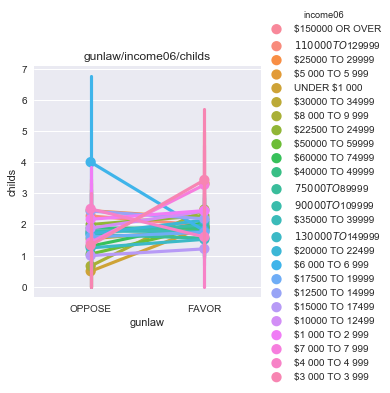

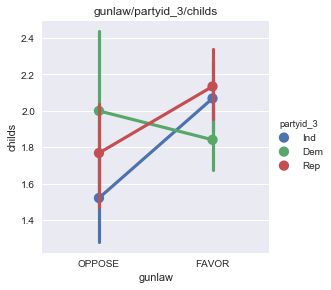

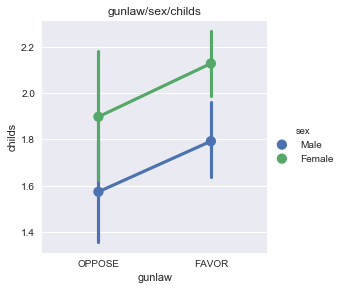

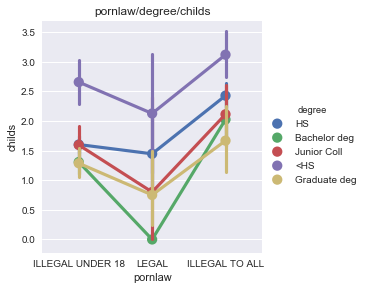

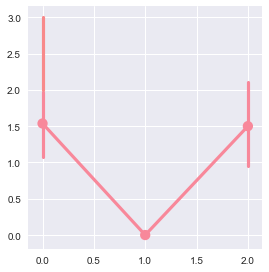

In [107]:
try:
    for nume in top1:
        for cat1 in policy+self_reported:
            for cat2 in dem_cat:
                g = sns.factorplot(x=cat1, y=nume, hue=cat2, data= gss[[nume,cat1,cat2]].dropna(axis=0, how = 'any'));
                g.set(title='/'.join([cat1,cat2,nume]), xlabel = cat1, ylabel=nume)
except KeyError and ValueError:
    pass

**Some conclusions:**
* People with <HS education have more children. 
* Democrats have fewer children. Republicans who oppose capital punishment have a lot of variance.
* Women have more children than men. Women who oppose capital punishment have more children while men who oppose capital punishment have more children.
* People who oppose marijuana have more children. 

**Now I want to filter the nuerical variables with two categoricals from people's policy view and their self-reporte calibers respectively. Just to experiment on how awesome seaborn is I will use factor plot and boxplot for different sets of numerical variables.**

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


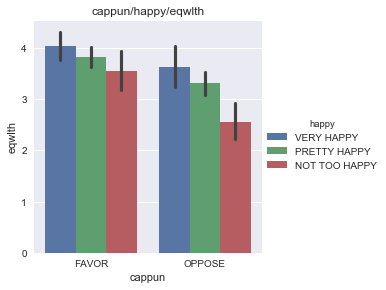

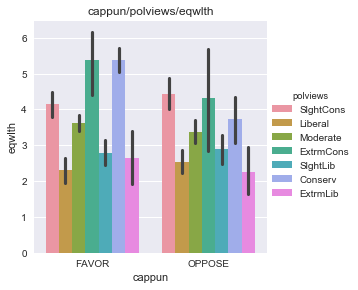

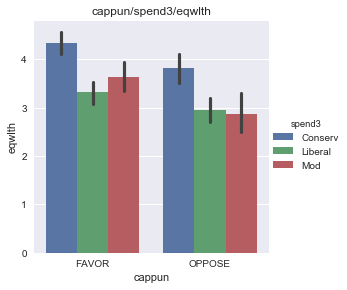

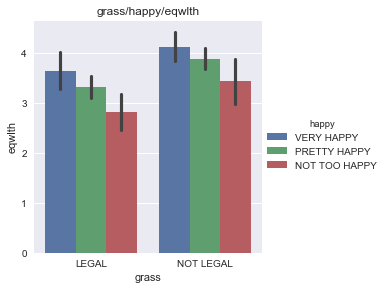

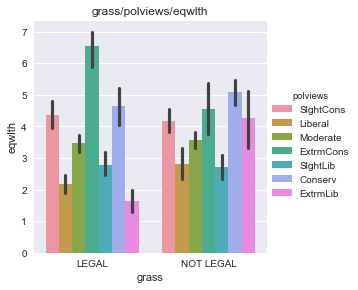

...

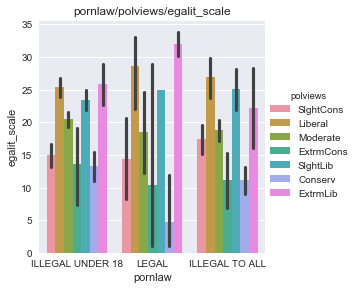

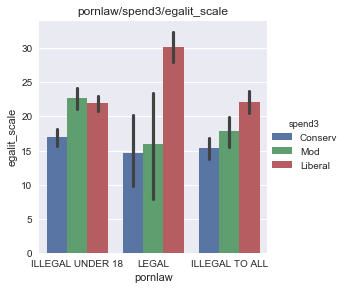

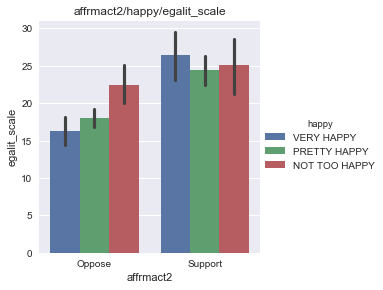

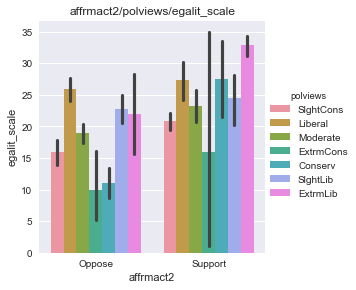

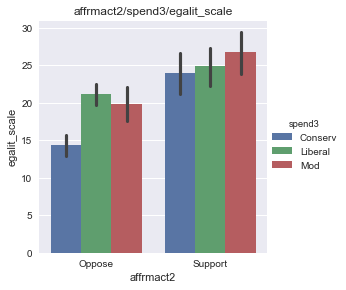

In [74]:
for nume in top:
    for cat1 in policy:
        for cat2 in self_reported:
#             fig, ax = plt.subplots()
#             sns.set()
            g=sns.factorplot(x=cat1, y=nume, hue=cat2, data=gss[[nume,cat1,cat2]].dropna(axis=0, how = 'any'), kind="bar")
#             ax = sns.violinplot(x=cat1, y=nume, hue=cat2, data=gss[[nume,cat1,cat2]].dropna(axis=0, how = 'any'));
#             ax = sns.stripplot(x=cat1, y=nume, hue=cat2, data=gss[[nume,cat1,cat2]].dropna(axis=0, how = 'any'), jitter=True)

#             g=sns.violinplot(x=cat1, y=nume, hue=cat2, data=gss[[nume,cat1,cat2]].dropna(axis=0, how = 'any'));
            g.set(title='/'.join([cat1,cat2,nume]), xlabel = cat1, ylabel=nume)

**Some conclusions:**
* People who support capital punishmen have more faith in wealth equality
* People who oppose marijuana have more faith in wealth equality
* People who oppose affirmative action have more faith in wealth equality
* People who favor capital punishment more likely to help black people
* Happy people and conservative people  are more likely to help black people 
* People who oppose affirmative action more likely to help black people 
* People who support capital punishment thinks the government should do more, especially for the conservatives and the happy people, and conservertive spending people.
* People who  oppose the affirmative action thinks the government should do more
* People who oppose the capital punishment are more egalitarian, especially for the unhappy and conservative ones
* People who support marijuana are more egalitarian
* People who support marijuana are more egalitarian.

**Now for another set of numerical variables**

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


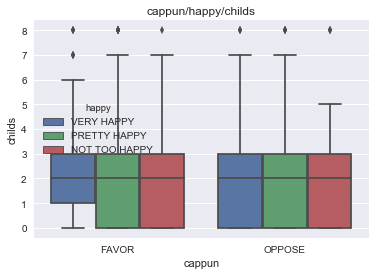

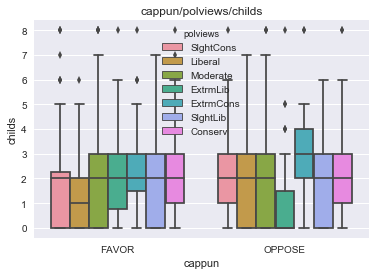

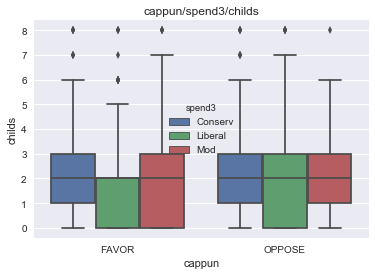

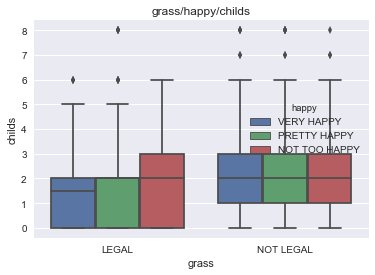

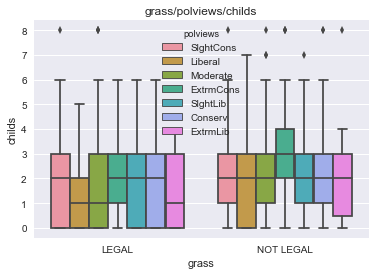

...

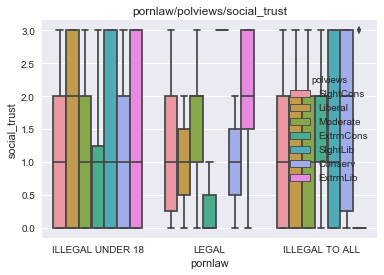

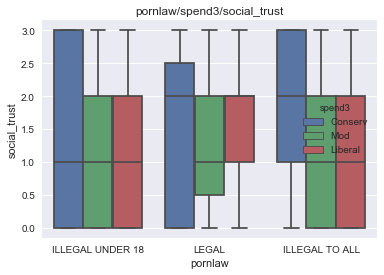

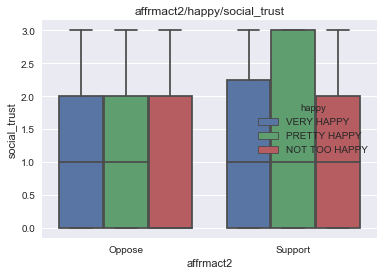

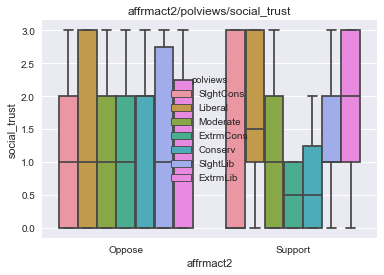

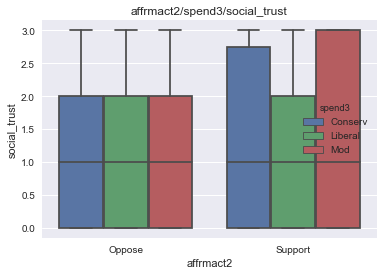

In [73]:
for nume in top1:
    for cat1 in policy:
        for cat2 in self_reported:
            fig, ax = plt.subplots()
            sns.set()
#             g=sns.factorplot(x=cat1, y=nume, hue=cat2, data=gss[[nume,cat1,cat2]].dropna(axis=0, how = 'any'), kind="swarm")
            g = sns.boxplot(x=cat1, y=nume, hue=cat2, data=gss[[nume,cat1,cat2]].dropna(axis=0, how = 'any'))
#             g=sns.violinplot(x=cat1, y=nume, hue=cat2, data=gss[[nume,cat1,cat2]].dropna(axis=0, how = 'any'));
            g.set(title='/'.join([cat1,cat2,nume]), xlabel = cat1, ylabel=nume)

**Some conclusions:**  
* Liberal who support marijuana have fewer children, while conservatives who oppose marijuana have more.
* Not too happy people who favor capital punishment score less in a vocabulary test. 
* People who support marijuana score slightly higher in vocabulary test.
* People who support affirmative action score slghtly lower in vocabulary test.
* Variance is high for social trust. 
* Conservatives who support marijuana have highter social trust.

Upon investigation, I realized that almost everything about affirmative action is counter intuitive. Thus, my writeup will be about that. 

Numerical variables associated with (affrmact2): ['eqlwth', 'authoritarianism', 'con_govt','wordsum']
Categorical variables associated with AA: ['ethnic', 'partyid_3', 'polviews', 'helpblk','helpnot']

In [196]:
num_aff=['eqwlth','authoritarianism', 'con_govt','wordsum','helpblk','helpnot']
num_dict={'eqwlth':'equality of wealth','authoritarianism':'authoritarianism', 
          'con_govt':'confidence in gov','wordsum':'vocab test','helpblk':'help black','helpnot':'gov intervention'}
cat_aff = ['ethnic', 'partyid_3', 'polviews']
cat_dict = {'ethnic':'ethnicity', 'partyid_3':'party', 'polviews':'political view'}

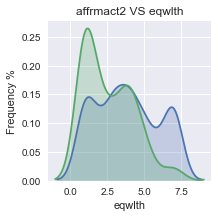

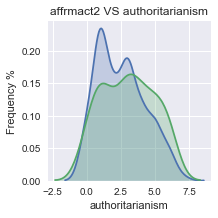

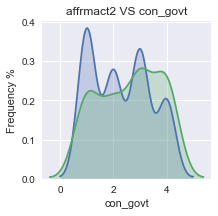

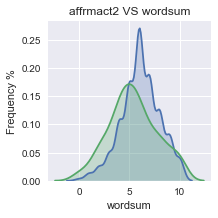

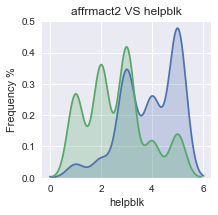

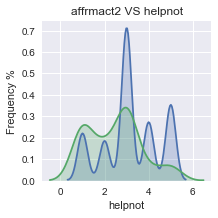

In [128]:
for i in num_aff:
    g = sns.FacetGrid(data=gss[[i,'affrmact2']].dropna(axis=0, how = 'any'), hue="affrmact2")
    g = g.map(sns.kdeplot, i, shade=True)
    g.set(title = f'affrmact2 VS {i}', ylabel='Frequency %')

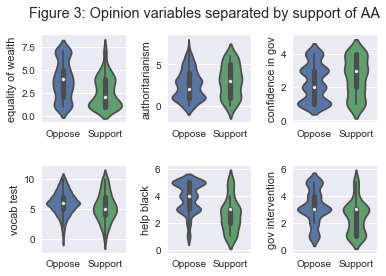

In [197]:
#     f, ((ax1, ax2), (ax3, ax4))= plt.subplots(2,2)
#     axes=(ax1, ax2, ax3, ax4)
#     f.set_suptitle='Figure 1')
#     for i,num in enumerate(num_aff):
#         g= sns.violinplot(x="affrmact2", y=num, data=gss[[num,'affrmact2']].dropna(axis=0, how = 'any'), ax=axes[i])
#         g.set(title = f'affrmact2 VS {num}')
fig=plt.figure()

for i,num in enumerate(num_aff):
    ax1=fig.add_subplot(2,3,i+1)
    g= sns.violinplot(x="affrmact2", y=num, data=gss[[num,'affrmact2']].dropna(axis=0, how = 'any'), ax=ax1)
    g.set(xlabel='', ylabel =num_dict[num])
plt.suptitle('Figure 3: Opinion variables separated by support of AA')
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)

fig.savefig('fig3')

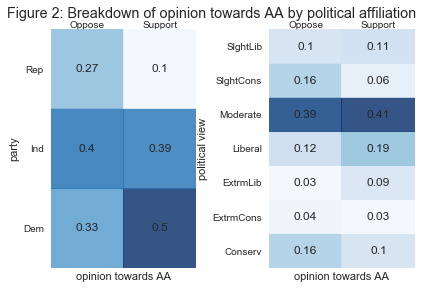

In [221]:
y = ['affrmact2']
x = ['partyid_3','polviews']
fig=plt.figure()
plt.tight_layout()
for i, a in enumerate(x):
    fig.tight_layout()
    ax=fig.add_subplot(1,2,i+1)
    cross = pd.crosstab(gss[a],gss['affrmact2'])
    #         print (cross.index)
    xlabels = list(cross.columns)
    ylabels = list(cross.index)
    counts = cross.as_matrix().astype(int)
    counts = np.round(counts/counts.sum(axis=0),2)
#     fig, ax = plt.subplots()
    heatmap = ax.pcolor(counts, cmap=plt.cm.Blues, alpha=0.8)
#     fig = plt.gcf()
    #             fig.set_size_inches(8, 11)
    #         ax.set_frame_on(False)
    ax.set_yticks(np.arange(counts.shape[0]) + 0.5, minor=False)
    ax.set_xticks(np.arange(counts.shape[1]) + 0.5, minor=False)
    #         ax.invert_yaxis()
    ax.xaxis.tick_top()
    #         xlabels = list(pd.DataFrame(cat_dict)[b]) 
    #         ylabels = list(pd.DataFrame(cat_dict)[a])
#     ax.set_title (' VS '.join([a,b]), y=1.2)
    ax.set_xticklabels(xlabels,y=0.97)
    ax.set_xlabel ('opinion towards AA')
    ax.set_yticklabels(ylabels)
    ax.set_ylabel (cat_dict[a])
    #         plt.xticks(rotation=90)
    #         ax.grid(False)
    ax = plt.gca()
    for t in ax.xaxis.get_major_ticks():
        t.tick1On = False
        t.tick2On = False
    for t in ax.yaxis.get_major_ticks():
        t.tick1On = False
        t.tick2On = False
    for y in range(counts.shape[0]):
        for x in range(counts.shape[1]):
            plt.text(x + 0.5, y + 0.5, counts[y, x],
                 horizontalalignment='center',
                 verticalalignment='center')
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
plt.suptitle('Figure 2: Breakdown of opinion towards AA by political affiliation', y=1)


fig.savefig('fig2')

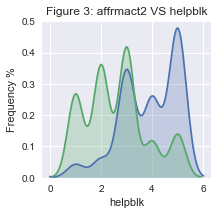

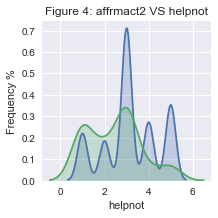

In [144]:

x = ['helpblk','helpnot']
fig=plt.figure()
 
# for i, a in enumerate(x):
fig.tight_layout()
# ax=fig.add_subplot(2,2,i+1)
df = gss[['helpblk','affrmact2']].dropna(axis=0, how = 'any')
g = sns.FacetGrid(data=df, hue="affrmact2")
g = g.map(sns.kdeplot, 'helpblk', shade=True)
# g.set(title = f'Figure 3: affrmact2 VS helpblk', ylabel='Frequency %')

df = gss[['helpnot','affrmact2']].dropna(axis=0, how = 'any')
g = sns.FacetGrid(data=df, hue="affrmact2")
g = g.map(sns.kdeplot, 'helpnot', shade=True)
# g.set(title = f'Figure 4: affrmact2 VS helpnot', ylabel='Frequency %')


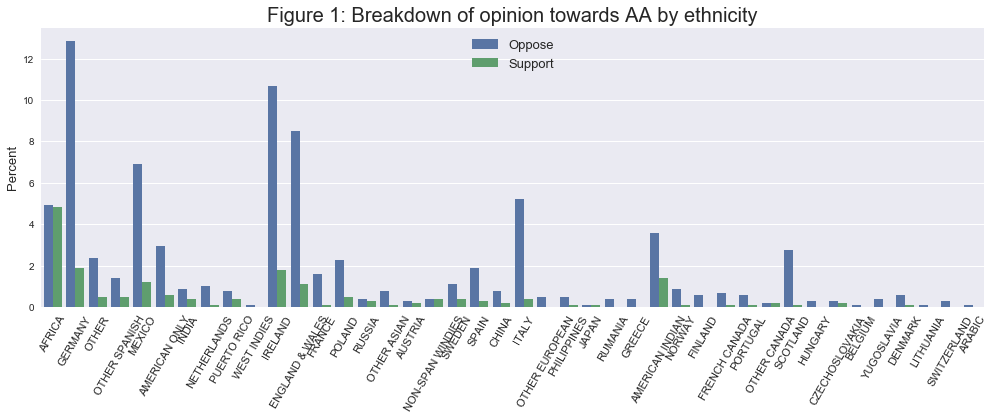

In [226]:
df = gss[['ethnic','affrmact2']].dropna(axis=0, how = 'any')
a4_dims = (14,6)
fig, ax = plt.subplots(figsize=a4_dims)
g = sns.barplot(x= 'ethnic', y='ethnic', hue='affrmact2', data=df, estimator=lambda x: len(x) / len(df) * 100, orient="v",ax=ax)
plt.xticks(rotation=60,fontsize= 11)
g.legend(fontsize=13)
ax.set_ylabel('Percent', fontsize =13)
ax.set_xlabel ('')
ax.set_title ('Figure 1: Breakdown of opinion towards AA by ethnicity',fontsize=20)
plt.tight_layout()
fig.savefig ('fig1')
# ax.set(title ='Figure : Breakdown of opinion towards AA by ethnicity',ylabel="Percent", fontsize =20)